In [11]:
from keras import Input, layers, backend, Model, losses, datasets, models, metrics, optimizers, initializers
from keras.utils import Sequence
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os

In [12]:

class FelixSequence(Sequence):
    def __init__(self, x_set, y_set, batch_size):
        """Here self.x is a list of paths to .npy input files. self.y is a
        corresponding list of paths to .npy output files."""
        self.x, self.y = x_set, y_set
        self.batch_size = batch_size

    def __len__(self):
        return int(np.ceil(len(self.x) / float(self.batch_size)))

    def __getitem__(self, idx):
        batch_x = self.x[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.y[idx * self.batch_size:(idx + 1) * self.batch_size]
        #print(np.array([np.load(file_name) for file_name in batch_x]).shape, np.array([np.load(file_name) for file_name in batch_y]).shape)
        return np.array([np.reshape(np.load(file_name), (128, 128, 1)) for file_name in batch_x]), np.array([np.reshape(np.load(file_name), (128, 128, 1)) for file_name in batch_y])
    

def gen_paths_labels(base_path = "D:\\Uni Work\\Masters Project\\electron_dists\\Data\\VAE_000_1\\Data"):
    """A generator to yield (data-paths, corresponding labels) tuples for each
    segment of data (typically training, validation, and testing)."""
    for segment in sorted(os.listdir(base_path)):
        segment_path = os.path.join(base_path, segment)
        input_paths = []
        output_paths = []
        for crystal in os.listdir(segment_path):
            crystal_path = os.path.join(segment_path, crystal)
            files = sorted(os.listdir(crystal_path))
            input_paths.append(os.path.join(crystal_path, files[0]))
            output_paths.append(os.path.join(crystal_path, files[1]))
        yield [input_paths, output_paths]

In [13]:
latent_dim = 10

"""
## Create a sampling layer
"""
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon


In [14]:
"""
## Build the encoder
"""
encoder_inputs = Input(shape=(128, 128, 1))
x = layers.Conv2D(32, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
#x = layers.Dropout(0.25)(x) #APPARANTLY THEY ARE BAD
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var", kernel_initializer='zeros', bias_initializer='zeros')(x)
z = Sampling()([z_mean, z_log_var])
encoder = Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 128, 128, 1) 0                                            
__________________________________________________________________________________________________
conv2d_2 (Conv2D)               (None, 64, 64, 32)   2080        input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_3 (Conv2D)               (None, 32, 32, 64)   131136      conv2d_2[0][0]                   
__________________________________________________________________________________________________
flatten_1 (Flatten)             (None, 65536)        0           conv2d_3[0][0]                   
____________________________________________________________________________________________

In [15]:
"""
## Build the decoder
"""


latent_inputs = Input(shape=(latent_dim,))
x = layers.Dense(32 * 32 * 64, activation="relu")(latent_inputs)
#x = layers.Dropout(0.25)(x)
x = layers.Reshape((32, 32, 64))(x)
x = layers.Conv2DTranspose(128, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(64, kernel_size = (8, 8), activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(1, kernel_size = (2, 2), activation="relu", padding="same")(x)
decoder = Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()


Model: "decoder"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         [(None, 10)]              0         
_________________________________________________________________
dense_3 (Dense)              (None, 65536)             720896    
_________________________________________________________________
reshape_1 (Reshape)          (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_transpose_3 (Conv2DTr (None, 64, 64, 128)       524416    
_________________________________________________________________
conv2d_transpose_4 (Conv2DTr (None, 128, 128, 64)      524352    
_________________________________________________________________
conv2d_transpose_5 (Conv2DTr (None, 128, 128, 1)       257       
Total params: 1,769,921
Trainable params: 1,769,921
Non-trainable params: 0
_________________________________________________

In [16]:
class VAE(Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder
        self.total_loss_tracker = metrics.Mean(name="total_loss")
        self.reconstruction_loss_tracker = metrics.Mean(
            name="reconstruction_loss"
        )
        self.kl_loss_tracker = metrics.Mean(name="kl_loss")

    @property
    def metrics(self):
        return [
            self.total_loss_tracker,
            self.reconstruction_loss_tracker,
            self.kl_loss_tracker,
        ]

    def train_step(self, data):
        x, y = data
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = self.encoder(x)
            reconstruction = self.decoder(z)
            reconstruction_loss = tf.reduce_mean(
                tf.reduce_sum(
                losses.mean_squared_logarithmic_error(y, reconstruction), axis=(1, 2)
                )
            )
            #print(z_mean, z_log_var, z)
            kl_loss = -0.5 * (1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var))
            kl_loss = tf.reduce_mean(tf.reduce_sum(kl_loss, axis=1))
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        self.total_loss_tracker.update_state(total_loss)
        self.reconstruction_loss_tracker.update_state(reconstruction_loss)
        self.kl_loss_tracker.update_state(kl_loss)
        return {
            "loss": self.total_loss_tracker.result(),
            "reconstruction_loss": self.reconstruction_loss_tracker.result(),
            "kl_loss": self.kl_loss_tracker.result(),
        }

    def call(self, data):
        return self.decoder(self.encoder(data)[2])



In [18]:
#vae = models.load_model("/home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_1")

vae = VAE(encoder, decoder)
vae.compile(optimizer=optimizers.Adam())

batch_size=128
data_path = "/home/ug-ml/felix-ML/VAE_000/Data/Data"
data = [i for i in gen_paths_labels(data_path)]
val_seq = FelixSequence(data[2][0], data[2][1], batch_size)
train_seq = FelixSequence(data[1][0], data[1][1], batch_size)
test_seq = FelixSequence(data[0][0], data[0][1], batch_size)
#print(train_seq)
vae.fit(train_seq, shuffle=True, workers=16, epochs=3000)



Epoch 1/3000
46/46 [==============================] - 10s 227ms/step - loss: 782.9495 - reconstruction_loss: 617.8148 - kl_loss: 2.4276
Epoch 2/3000
46/46 [==============================] - 11s 232ms/step - loss: 421.8544 - reconstruction_loss: 405.2404 - kl_loss: 7.4979
Epoch 3/3000
46/46 [==============================] - 15s 323ms/step - loss: 388.4412 - reconstruction_loss: 378.4671 - kl_loss: 8.7726
Epoch 4/3000
46/46 [==============================] - 11s 230ms/step - loss: 374.1555 - reconstruction_loss: 360.2391 - kl_loss: 10.2542
Epoch 5/3000
46/46 [==============================] - 11s 231ms/step - loss: 356.1474 - reconstruction_loss: 340.1203 - kl_loss: 12.4455
Epoch 6/3000
46/46 [==============================] - 11s 229ms/step - loss: 349.0262 - reconstruction_loss: 329.4208 - kl_loss: 12.8446
Epoch 7/3000
46/46 [==============================] - 11s 230ms/step - loss: 330.0625 - reconstruction_loss: 313.9210 - kl_loss: 13.5639
Epoch 8/3000
46/46 [========================

46/46 [==============================] - 11s 230ms/step - loss: 124.0354 - reconstruction_loss: 105.6371 - kl_loss: 20.3140
Epoch 120/3000
46/46 [==============================] - 10s 227ms/step - loss: 127.0168 - reconstruction_loss: 105.8506 - kl_loss: 20.2372
Epoch 121/3000
46/46 [==============================] - 10s 228ms/step - loss: 122.7754 - reconstruction_loss: 102.5724 - kl_loss: 20.2617
Epoch 122/3000
46/46 [==============================] - 11s 230ms/step - loss: 119.8582 - reconstruction_loss: 100.7421 - kl_loss: 20.2436
Epoch 123/3000
46/46 [==============================] - 11s 228ms/step - loss: 118.6244 - reconstruction_loss: 99.7555 - kl_loss: 20.3140
Epoch 124/3000
46/46 [==============================] - 10s 227ms/step - loss: 120.7007 - reconstruction_loss: 100.8020 - kl_loss: 20.3439
Epoch 125/3000
46/46 [==============================] - 10s 228ms/step - loss: 120.4364 - reconstruction_loss: 101.3081 - kl_loss: 20.2334
Epoch 126/3000
46/46 [=====================

46/46 [==============================] - 10s 227ms/step - loss: 93.8995 - reconstruction_loss: 74.7180 - kl_loss: 19.4586
Epoch 238/3000
46/46 [==============================] - 11s 232ms/step - loss: 93.3751 - reconstruction_loss: 73.8866 - kl_loss: 19.5253
Epoch 239/3000
46/46 [==============================] - 11s 231ms/step - loss: 94.9300 - reconstruction_loss: 74.7452 - kl_loss: 19.5763
Epoch 240/3000
46/46 [==============================] - 10s 228ms/step - loss: 95.0079 - reconstruction_loss: 75.4597 - kl_loss: 19.5988
Epoch 241/3000
46/46 [==============================] - 10s 228ms/step - loss: 93.1199 - reconstruction_loss: 73.8349 - kl_loss: 19.6083
Epoch 242/3000
46/46 [==============================] - 11s 229ms/step - loss: 91.5417 - reconstruction_loss: 73.2121 - kl_loss: 19.6054
Epoch 243/3000
46/46 [==============================] - 11s 229ms/step - loss: 92.0660 - reconstruction_loss: 74.0483 - kl_loss: 19.5908
Epoch 244/3000
46/46 [==============================] - 

46/46 [==============================] - 11s 228ms/step - loss: 85.6575 - reconstruction_loss: 65.2946 - kl_loss: 19.4431
Epoch 356/3000
46/46 [==============================] - 10s 228ms/step - loss: 83.8273 - reconstruction_loss: 64.8449 - kl_loss: 19.3105
Epoch 357/3000
46/46 [==============================] - 10s 228ms/step - loss: 82.5963 - reconstruction_loss: 64.9885 - kl_loss: 19.3279
Epoch 358/3000
46/46 [==============================] - 11s 229ms/step - loss: 81.0168 - reconstruction_loss: 62.0573 - kl_loss: 19.2959
Epoch 359/3000
46/46 [==============================] - 10s 228ms/step - loss: 81.7999 - reconstruction_loss: 62.5475 - kl_loss: 19.3577
Epoch 360/3000
46/46 [==============================] - 10s 228ms/step - loss: 80.6999 - reconstruction_loss: 61.8145 - kl_loss: 19.2975
Epoch 361/3000
46/46 [==============================] - 10s 227ms/step - loss: 82.9709 - reconstruction_loss: 65.5936 - kl_loss: 19.3042
Epoch 362/3000
46/46 [==============================] - 

46/46 [==============================] - 10s 228ms/step - loss: 73.6571 - reconstruction_loss: 56.6372 - kl_loss: 18.0104
Epoch 474/3000
46/46 [==============================] - 10s 228ms/step - loss: 75.0035 - reconstruction_loss: 57.1095 - kl_loss: 17.9704
Epoch 475/3000
46/46 [==============================] - 11s 229ms/step - loss: 72.9278 - reconstruction_loss: 55.8723 - kl_loss: 17.8704
Epoch 476/3000
46/46 [==============================] - 11s 229ms/step - loss: 75.0272 - reconstruction_loss: 56.0691 - kl_loss: 17.9943
Epoch 477/3000
46/46 [==============================] - 11s 229ms/step - loss: 73.4979 - reconstruction_loss: 55.7656 - kl_loss: 17.9688
Epoch 478/3000
46/46 [==============================] - 10s 228ms/step - loss: 73.2707 - reconstruction_loss: 55.5443 - kl_loss: 17.9914
Epoch 479/3000
46/46 [==============================] - 11s 229ms/step - loss: 72.1334 - reconstruction_loss: 54.8985 - kl_loss: 18.0064
Epoch 480/3000
46/46 [==============================] - 

46/46 [==============================] - 10s 228ms/step - loss: 69.5381 - reconstruction_loss: 51.6017 - kl_loss: 17.7935
Epoch 592/3000
46/46 [==============================] - 10s 227ms/step - loss: 69.6859 - reconstruction_loss: 51.8562 - kl_loss: 17.8124
Epoch 593/3000
46/46 [==============================] - 11s 230ms/step - loss: 68.5172 - reconstruction_loss: 52.2459 - kl_loss: 17.8151
Epoch 594/3000
46/46 [==============================] - 11s 229ms/step - loss: 70.5857 - reconstruction_loss: 51.7817 - kl_loss: 17.8684
Epoch 595/3000
46/46 [==============================] - 11s 232ms/step - loss: 68.8484 - reconstruction_loss: 51.4335 - kl_loss: 17.8063
Epoch 596/3000
46/46 [==============================] - 11s 229ms/step - loss: 69.9589 - reconstruction_loss: 51.6178 - kl_loss: 17.8282
Epoch 597/3000
46/46 [==============================] - 11s 230ms/step - loss: 69.1808 - reconstruction_loss: 51.1671 - kl_loss: 17.8362
Epoch 598/3000
46/46 [==============================] - 

46/46 [==============================] - 10s 228ms/step - loss: 67.2378 - reconstruction_loss: 49.9741 - kl_loss: 17.6805
Epoch 710/3000
46/46 [==============================] - 11s 230ms/step - loss: 65.4770 - reconstruction_loss: 48.6476 - kl_loss: 17.6952
Epoch 711/3000
46/46 [==============================] - 10s 228ms/step - loss: 65.7593 - reconstruction_loss: 50.3008 - kl_loss: 17.7384
Epoch 712/3000
46/46 [==============================] - 11s 229ms/step - loss: 68.5613 - reconstruction_loss: 51.2547 - kl_loss: 17.7474
Epoch 713/3000
46/46 [==============================] - 10s 228ms/step - loss: 69.4081 - reconstruction_loss: 52.2308 - kl_loss: 17.7469
Epoch 714/3000
46/46 [==============================] - 14s 313ms/step - loss: 68.2551 - reconstruction_loss: 50.9175 - kl_loss: 17.7102
Epoch 715/3000
46/46 [==============================] - 10s 227ms/step - loss: 65.7268 - reconstruction_loss: 49.1746 - kl_loss: 17.6548
Epoch 716/3000
46/46 [==============================] - 

46/46 [==============================] - 10s 228ms/step - loss: 62.9050 - reconstruction_loss: 46.4755 - kl_loss: 17.5240
Epoch 828/3000
46/46 [==============================] - 10s 228ms/step - loss: 62.9284 - reconstruction_loss: 47.3241 - kl_loss: 17.4173
Epoch 829/3000
46/46 [==============================] - 11s 229ms/step - loss: 65.4571 - reconstruction_loss: 48.2036 - kl_loss: 17.5101
Epoch 830/3000
46/46 [==============================] - 11s 229ms/step - loss: 65.4220 - reconstruction_loss: 49.2455 - kl_loss: 17.4363
Epoch 831/3000
46/46 [==============================] - 11s 229ms/step - loss: 66.6007 - reconstruction_loss: 48.0160 - kl_loss: 17.5817
Epoch 832/3000
46/46 [==============================] - 10s 228ms/step - loss: 65.3364 - reconstruction_loss: 47.2745 - kl_loss: 17.4667
Epoch 833/3000
46/46 [==============================] - 11s 229ms/step - loss: 63.1344 - reconstruction_loss: 46.9239 - kl_loss: 17.5145
Epoch 834/3000
46/46 [==============================] - 

46/46 [==============================] - 11s 229ms/step - loss: 61.5375 - reconstruction_loss: 44.5312 - kl_loss: 16.9663
Epoch 946/3000
46/46 [==============================] - 11s 230ms/step - loss: 61.8174 - reconstruction_loss: 45.2729 - kl_loss: 16.9405
Epoch 947/3000
46/46 [==============================] - 10s 228ms/step - loss: 61.9577 - reconstruction_loss: 44.5796 - kl_loss: 16.9442
Epoch 948/3000
46/46 [==============================] - 10s 228ms/step - loss: 64.8157 - reconstruction_loss: 46.5504 - kl_loss: 16.9319
Epoch 949/3000
46/46 [==============================] - 10s 227ms/step - loss: 62.7755 - reconstruction_loss: 47.3507 - kl_loss: 16.9539
Epoch 950/3000
46/46 [==============================] - 10s 228ms/step - loss: 62.6911 - reconstruction_loss: 45.3635 - kl_loss: 16.8978
Epoch 951/3000
46/46 [==============================] - 11s 228ms/step - loss: 60.9868 - reconstruction_loss: 44.3634 - kl_loss: 16.8926
Epoch 952/3000
46/46 [==============================] - 

46/46 [==============================] - 10s 227ms/step - loss: 61.2165 - reconstruction_loss: 45.2523 - kl_loss: 15.9031
Epoch 1064/3000
46/46 [==============================] - 10s 228ms/step - loss: 59.3549 - reconstruction_loss: 43.7122 - kl_loss: 15.9115
Epoch 1065/3000
46/46 [==============================] - 10s 228ms/step - loss: 58.5410 - reconstruction_loss: 42.6648 - kl_loss: 15.8352
Epoch 1066/3000
46/46 [==============================] - 10s 227ms/step - loss: 59.6045 - reconstruction_loss: 43.9717 - kl_loss: 15.7884
Epoch 1067/3000
46/46 [==============================] - 11s 228ms/step - loss: 59.9364 - reconstruction_loss: 44.5234 - kl_loss: 15.8709
Epoch 1068/3000
46/46 [==============================] - 10s 227ms/step - loss: 59.7387 - reconstruction_loss: 44.5822 - kl_loss: 15.8071
Epoch 1069/3000
46/46 [==============================] - 10s 228ms/step - loss: 59.9523 - reconstruction_loss: 43.6817 - kl_loss: 15.9054
Epoch 1070/3000
46/46 [===========================

46/46 [==============================] - 11s 229ms/step - loss: 56.8724 - reconstruction_loss: 41.7120 - kl_loss: 15.6213
Epoch 1182/3000
46/46 [==============================] - 10s 227ms/step - loss: 55.4582 - reconstruction_loss: 41.1070 - kl_loss: 15.6380
Epoch 1183/3000
46/46 [==============================] - 10s 227ms/step - loss: 56.0056 - reconstruction_loss: 41.2497 - kl_loss: 15.6474
Epoch 1184/3000
46/46 [==============================] - 11s 229ms/step - loss: 55.8193 - reconstruction_loss: 41.0397 - kl_loss: 15.6587
Epoch 1185/3000
46/46 [==============================] - 10s 228ms/step - loss: 56.5204 - reconstruction_loss: 41.8367 - kl_loss: 15.6678
Epoch 1186/3000
46/46 [==============================] - 11s 229ms/step - loss: 58.7753 - reconstruction_loss: 42.4736 - kl_loss: 15.7597
Epoch 1187/3000
46/46 [==============================] - 11s 229ms/step - loss: 57.2956 - reconstruction_loss: 44.1886 - kl_loss: 15.6398
Epoch 1188/3000
46/46 [===========================

46/46 [==============================] - 11s 229ms/step - loss: 55.8636 - reconstruction_loss: 40.0304 - kl_loss: 15.5924
Epoch 1300/3000
46/46 [==============================] - 11s 230ms/step - loss: 56.0120 - reconstruction_loss: 40.4961 - kl_loss: 15.6032
Epoch 1301/3000
46/46 [==============================] - 11s 231ms/step - loss: 54.8040 - reconstruction_loss: 40.8829 - kl_loss: 15.5983
Epoch 1302/3000
46/46 [==============================] - 11s 229ms/step - loss: 56.5021 - reconstruction_loss: 40.6574 - kl_loss: 15.5954
Epoch 1303/3000
46/46 [==============================] - 11s 229ms/step - loss: 56.8592 - reconstruction_loss: 41.0990 - kl_loss: 15.6163
Epoch 1304/3000
46/46 [==============================] - 11s 231ms/step - loss: 55.1386 - reconstruction_loss: 40.4718 - kl_loss: 15.6543
Epoch 1305/3000
46/46 [==============================] - 11s 230ms/step - loss: 55.1679 - reconstruction_loss: 40.2310 - kl_loss: 15.5871
Epoch 1306/3000
46/46 [===========================

46/46 [==============================] - 11s 230ms/step - loss: 55.1909 - reconstruction_loss: 39.7718 - kl_loss: 15.6322
Epoch 1418/3000
46/46 [==============================] - 11s 230ms/step - loss: 55.2343 - reconstruction_loss: 39.3830 - kl_loss: 15.6426
Epoch 1419/3000
46/46 [==============================] - 15s 332ms/step - loss: 53.7166 - reconstruction_loss: 39.3696 - kl_loss: 15.6919
Epoch 1420/3000
46/46 [==============================] - 11s 229ms/step - loss: 54.5458 - reconstruction_loss: 39.3120 - kl_loss: 15.5821
Epoch 1421/3000
46/46 [==============================] - 11s 229ms/step - loss: 54.6445 - reconstruction_loss: 39.0159 - kl_loss: 15.5806
Epoch 1422/3000
46/46 [==============================] - 11s 228ms/step - loss: 55.0694 - reconstruction_loss: 40.3337 - kl_loss: 15.5973
Epoch 1423/3000
46/46 [==============================] - 10s 228ms/step - loss: 56.5689 - reconstruction_loss: 41.2907 - kl_loss: 15.5793
Epoch 1424/3000
46/46 [===========================

46/46 [==============================] - 10s 228ms/step - loss: 52.6371 - reconstruction_loss: 38.5259 - kl_loss: 15.5519
Epoch 1536/3000
46/46 [==============================] - 10s 228ms/step - loss: 54.8474 - reconstruction_loss: 40.5424 - kl_loss: 15.5725
Epoch 1537/3000
46/46 [==============================] - 10s 228ms/step - loss: 55.7029 - reconstruction_loss: 39.8564 - kl_loss: 15.5426
Epoch 1538/3000
46/46 [==============================] - 11s 229ms/step - loss: 55.0252 - reconstruction_loss: 39.5567 - kl_loss: 15.6011
Epoch 1539/3000
46/46 [==============================] - 11s 230ms/step - loss: 54.2506 - reconstruction_loss: 39.6579 - kl_loss: 15.5835
Epoch 1540/3000
46/46 [==============================] - 11s 229ms/step - loss: 54.1671 - reconstruction_loss: 39.0966 - kl_loss: 15.5943
Epoch 1541/3000
46/46 [==============================] - 11s 228ms/step - loss: 53.8061 - reconstruction_loss: 38.8995 - kl_loss: 15.5992
Epoch 1542/3000
46/46 [===========================

46/46 [==============================] - 11s 230ms/step - loss: 53.5056 - reconstruction_loss: 38.8812 - kl_loss: 15.5338
Epoch 1654/3000
46/46 [==============================] - 11s 230ms/step - loss: 53.3154 - reconstruction_loss: 38.3793 - kl_loss: 15.6050
Epoch 1655/3000
46/46 [==============================] - 11s 228ms/step - loss: 54.4071 - reconstruction_loss: 38.5553 - kl_loss: 15.4854
Epoch 1656/3000
46/46 [==============================] - 10s 228ms/step - loss: 53.1628 - reconstruction_loss: 38.4451 - kl_loss: 15.5508
Epoch 1657/3000
46/46 [==============================] - 15s 315ms/step - loss: 52.0088 - reconstruction_loss: 38.1788 - kl_loss: 15.5487
Epoch 1658/3000
46/46 [==============================] - 11s 229ms/step - loss: 53.0366 - reconstruction_loss: 38.6860 - kl_loss: 15.5348
Epoch 1659/3000
46/46 [==============================] - 11s 229ms/step - loss: 55.1512 - reconstruction_loss: 39.0568 - kl_loss: 15.5817
Epoch 1660/3000
46/46 [===========================

46/46 [==============================] - 11s 232ms/step - loss: 52.8684 - reconstruction_loss: 36.7155 - kl_loss: 15.5698
Epoch 1772/3000
46/46 [==============================] - 11s 232ms/step - loss: 51.2194 - reconstruction_loss: 36.8474 - kl_loss: 15.5165
Epoch 1773/3000
46/46 [==============================] - 11s 229ms/step - loss: 51.7150 - reconstruction_loss: 37.2630 - kl_loss: 15.6121
Epoch 1774/3000
46/46 [==============================] - 11s 229ms/step - loss: 52.3914 - reconstruction_loss: 37.2571 - kl_loss: 15.5767
Epoch 1775/3000
46/46 [==============================] - 11s 229ms/step - loss: 53.7138 - reconstruction_loss: 38.4656 - kl_loss: 15.5770
Epoch 1776/3000
46/46 [==============================] - 11s 229ms/step - loss: 53.1805 - reconstruction_loss: 37.6572 - kl_loss: 15.5507
Epoch 1777/3000
46/46 [==============================] - 10s 228ms/step - loss: 54.4140 - reconstruction_loss: 38.7670 - kl_loss: 15.5800
Epoch 1778/3000
46/46 [===========================

46/46 [==============================] - 10s 226ms/step - loss: 52.3792 - reconstruction_loss: 37.9038 - kl_loss: 15.5225
Epoch 1890/3000
46/46 [==============================] - 10s 228ms/step - loss: 52.7563 - reconstruction_loss: 37.3374 - kl_loss: 15.6176
Epoch 1891/3000
46/46 [==============================] - 10s 227ms/step - loss: 52.6882 - reconstruction_loss: 37.6906 - kl_loss: 15.5807
Epoch 1892/3000
46/46 [==============================] - 11s 228ms/step - loss: 55.0517 - reconstruction_loss: 38.5261 - kl_loss: 15.5637
Epoch 1893/3000
46/46 [==============================] - 11s 229ms/step - loss: 52.5658 - reconstruction_loss: 37.7879 - kl_loss: 15.5470
Epoch 1894/3000
46/46 [==============================] - 10s 228ms/step - loss: 52.1408 - reconstruction_loss: 37.1800 - kl_loss: 15.5351
Epoch 1895/3000
46/46 [==============================] - 11s 228ms/step - loss: 52.3606 - reconstruction_loss: 36.6920 - kl_loss: 15.5367
Epoch 1896/3000
46/46 [===========================

46/46 [==============================] - 10s 228ms/step - loss: 51.7766 - reconstruction_loss: 36.1978 - kl_loss: 15.5352
Epoch 2008/3000
46/46 [==============================] - 11s 229ms/step - loss: 51.9678 - reconstruction_loss: 36.7984 - kl_loss: 15.5415
Epoch 2009/3000
46/46 [==============================] - 10s 227ms/step - loss: 51.9815 - reconstruction_loss: 36.5081 - kl_loss: 15.5013
Epoch 2010/3000
46/46 [==============================] - 10s 227ms/step - loss: 52.7460 - reconstruction_loss: 37.3716 - kl_loss: 15.6395
Epoch 2011/3000
46/46 [==============================] - 10s 228ms/step - loss: 52.4041 - reconstruction_loss: 36.5186 - kl_loss: 15.5652
Epoch 2012/3000
46/46 [==============================] - 15s 326ms/step - loss: 51.5303 - reconstruction_loss: 36.9810 - kl_loss: 15.5261
Epoch 2013/3000
46/46 [==============================] - 10s 227ms/step - loss: 51.1544 - reconstruction_loss: 36.5145 - kl_loss: 15.5525
Epoch 2014/3000
46/46 [===========================

46/46 [==============================] - 10s 228ms/step - loss: 50.9041 - reconstruction_loss: 36.1326 - kl_loss: 15.4837
Epoch 2126/3000
46/46 [==============================] - 10s 228ms/step - loss: 51.3410 - reconstruction_loss: 36.6035 - kl_loss: 15.5345
Epoch 2127/3000
46/46 [==============================] - 11s 229ms/step - loss: 50.7113 - reconstruction_loss: 35.4038 - kl_loss: 15.5133
Epoch 2128/3000
46/46 [==============================] - 10s 228ms/step - loss: 50.4634 - reconstruction_loss: 35.4531 - kl_loss: 15.4723
Epoch 2129/3000
46/46 [==============================] - 11s 229ms/step - loss: 50.6507 - reconstruction_loss: 35.4781 - kl_loss: 15.4986
Epoch 2130/3000
46/46 [==============================] - 11s 229ms/step - loss: 51.4051 - reconstruction_loss: 35.9799 - kl_loss: 15.5067
Epoch 2131/3000
46/46 [==============================] - 11s 229ms/step - loss: 51.8178 - reconstruction_loss: 36.2972 - kl_loss: 15.5305
Epoch 2132/3000
46/46 [===========================

46/46 [==============================] - 11s 229ms/step - loss: 50.7695 - reconstruction_loss: 35.9689 - kl_loss: 15.5764
Epoch 2244/3000
46/46 [==============================] - 11s 230ms/step - loss: 49.9142 - reconstruction_loss: 35.4187 - kl_loss: 15.5110
Epoch 2245/3000
46/46 [==============================] - 11s 229ms/step - loss: 51.3750 - reconstruction_loss: 35.4859 - kl_loss: 15.5636
Epoch 2246/3000
46/46 [==============================] - 11s 230ms/step - loss: 50.7043 - reconstruction_loss: 35.7020 - kl_loss: 15.5077
Epoch 2247/3000
46/46 [==============================] - 11s 229ms/step - loss: 50.8012 - reconstruction_loss: 36.0678 - kl_loss: 15.5637
Epoch 2248/3000
46/46 [==============================] - 11s 230ms/step - loss: 49.6294 - reconstruction_loss: 35.7170 - kl_loss: 15.5491
Epoch 2249/3000
46/46 [==============================] - 11s 229ms/step - loss: 52.4971 - reconstruction_loss: 37.2794 - kl_loss: 15.5331
Epoch 2250/3000
46/46 [===========================

46/46 [==============================] - 10s 227ms/step - loss: 50.5128 - reconstruction_loss: 35.9794 - kl_loss: 15.5112
Epoch 2362/3000
46/46 [==============================] - 11s 229ms/step - loss: 51.3141 - reconstruction_loss: 35.7108 - kl_loss: 15.5409
Epoch 2363/3000
46/46 [==============================] - 11s 229ms/step - loss: 50.2535 - reconstruction_loss: 35.4531 - kl_loss: 15.5929
Epoch 2364/3000
46/46 [==============================] - 11s 230ms/step - loss: 52.5215 - reconstruction_loss: 36.4365 - kl_loss: 15.5237
Epoch 2365/3000
46/46 [==============================] - 11s 229ms/step - loss: 50.6253 - reconstruction_loss: 35.1739 - kl_loss: 15.5041
Epoch 2366/3000
46/46 [==============================] - 11s 229ms/step - loss: 50.5356 - reconstruction_loss: 35.2433 - kl_loss: 15.4542
Epoch 2367/3000
46/46 [==============================] - 11s 229ms/step - loss: 51.4086 - reconstruction_loss: 35.7548 - kl_loss: 15.5105
Epoch 2368/3000
46/46 [===========================

46/46 [==============================] - 11s 229ms/step - loss: 49.6603 - reconstruction_loss: 34.1569 - kl_loss: 15.5421
Epoch 2480/3000
46/46 [==============================] - 10s 227ms/step - loss: 49.2985 - reconstruction_loss: 34.6161 - kl_loss: 15.4693
Epoch 2481/3000
46/46 [==============================] - 11s 230ms/step - loss: 48.9068 - reconstruction_loss: 34.4525 - kl_loss: 15.4925
Epoch 2482/3000
46/46 [==============================] - 11s 229ms/step - loss: 48.7709 - reconstruction_loss: 34.4276 - kl_loss: 15.5304
Epoch 2483/3000
46/46 [==============================] - 11s 232ms/step - loss: 50.2392 - reconstruction_loss: 34.9207 - kl_loss: 15.5204
Epoch 2484/3000
46/46 [==============================] - 10s 228ms/step - loss: 50.4716 - reconstruction_loss: 35.1806 - kl_loss: 15.4781
Epoch 2485/3000
46/46 [==============================] - 10s 227ms/step - loss: 48.6380 - reconstruction_loss: 33.9416 - kl_loss: 15.5871
Epoch 2486/3000
46/46 [===========================

46/46 [==============================] - 10s 228ms/step - loss: 51.5488 - reconstruction_loss: 35.4494 - kl_loss: 15.4973
Epoch 2598/3000
46/46 [==============================] - 10s 227ms/step - loss: 49.7218 - reconstruction_loss: 34.3139 - kl_loss: 15.5258
Epoch 2599/3000
46/46 [==============================] - 11s 231ms/step - loss: 50.3862 - reconstruction_loss: 35.4376 - kl_loss: 15.4612
Epoch 2600/3000
46/46 [==============================] - 11s 228ms/step - loss: 49.1017 - reconstruction_loss: 34.4106 - kl_loss: 15.4542
Epoch 2601/3000
46/46 [==============================] - 10s 228ms/step - loss: 50.0481 - reconstruction_loss: 34.3136 - kl_loss: 15.6064
Epoch 2602/3000
46/46 [==============================] - 10s 228ms/step - loss: 49.4277 - reconstruction_loss: 34.2035 - kl_loss: 15.4642
Epoch 2603/3000
46/46 [==============================] - 10s 227ms/step - loss: 48.9169 - reconstruction_loss: 34.5276 - kl_loss: 15.4637
Epoch 2604/3000
46/46 [===========================

46/46 [==============================] - 11s 230ms/step - loss: 49.8813 - reconstruction_loss: 34.9429 - kl_loss: 15.4890
Epoch 2716/3000
46/46 [==============================] - 10s 228ms/step - loss: 48.6352 - reconstruction_loss: 33.7595 - kl_loss: 15.5250
Epoch 2717/3000
46/46 [==============================] - 10s 228ms/step - loss: 49.5275 - reconstruction_loss: 33.9104 - kl_loss: 15.4993
Epoch 2718/3000
46/46 [==============================] - 11s 230ms/step - loss: 49.9558 - reconstruction_loss: 34.3433 - kl_loss: 15.4570
Epoch 2719/3000
46/46 [==============================] - 11s 229ms/step - loss: 48.3029 - reconstruction_loss: 33.4099 - kl_loss: 15.4861
Epoch 2720/3000
46/46 [==============================] - 10s 228ms/step - loss: 49.2601 - reconstruction_loss: 33.8892 - kl_loss: 15.4556
Epoch 2721/3000
46/46 [==============================] - 11s 229ms/step - loss: 49.6370 - reconstruction_loss: 34.5949 - kl_loss: 15.4415
Epoch 2722/3000
46/46 [===========================

46/46 [==============================] - 11s 229ms/step - loss: 48.3702 - reconstruction_loss: 33.2761 - kl_loss: 15.4669
Epoch 2834/3000
46/46 [==============================] - 10s 228ms/step - loss: 48.1942 - reconstruction_loss: 33.4572 - kl_loss: 15.5212
Epoch 2835/3000
46/46 [==============================] - 11s 230ms/step - loss: 49.7593 - reconstruction_loss: 33.6616 - kl_loss: 15.4844
Epoch 2836/3000
46/46 [==============================] - 11s 229ms/step - loss: 49.0977 - reconstruction_loss: 33.8917 - kl_loss: 15.4775
Epoch 2837/3000
46/46 [==============================] - 11s 229ms/step - loss: 49.0644 - reconstruction_loss: 33.6246 - kl_loss: 15.5401
Epoch 2838/3000
46/46 [==============================] - 11s 230ms/step - loss: 48.5498 - reconstruction_loss: 34.2054 - kl_loss: 15.5047
Epoch 2839/3000
46/46 [==============================] - 15s 327ms/step - loss: 49.2941 - reconstruction_loss: 34.7136 - kl_loss: 15.5457
Epoch 2840/3000
46/46 [===========================

46/46 [==============================] - 11s 228ms/step - loss: 49.2131 - reconstruction_loss: 33.6180 - kl_loss: 15.5121
Epoch 2952/3000
46/46 [==============================] - 11s 230ms/step - loss: 48.2927 - reconstruction_loss: 33.0417 - kl_loss: 15.4714
Epoch 2953/3000
46/46 [==============================] - 11s 229ms/step - loss: 48.2505 - reconstruction_loss: 32.9509 - kl_loss: 15.5156
Epoch 2954/3000
46/46 [==============================] - 10s 227ms/step - loss: 47.7750 - reconstruction_loss: 32.9117 - kl_loss: 15.4736
Epoch 2955/3000
46/46 [==============================] - 10s 226ms/step - loss: 48.7580 - reconstruction_loss: 33.3863 - kl_loss: 15.4886
Epoch 2956/3000
46/46 [==============================] - 10s 227ms/step - loss: 47.9463 - reconstruction_loss: 33.1737 - kl_loss: 15.4462
Epoch 2957/3000
46/46 [==============================] - 11s 229ms/step - loss: 48.6448 - reconstruction_loss: 33.4838 - kl_loss: 15.4890
Epoch 2958/3000
46/46 [===========================

In [19]:
vae.save("/home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_3")


INFO:tensorflow:Assets written to: /home/ug-ml/felix-ML/VAE_000/Data/Models/VAE_3/assets


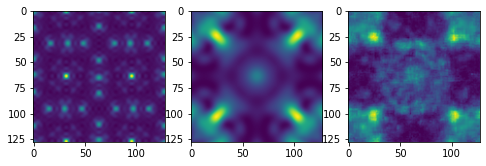

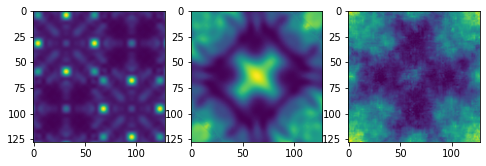

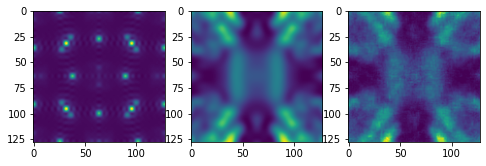

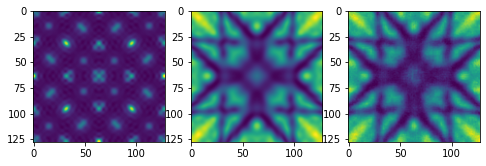

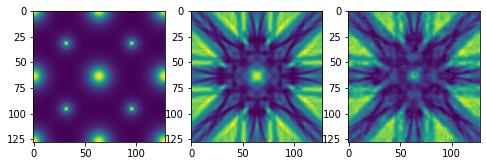

...

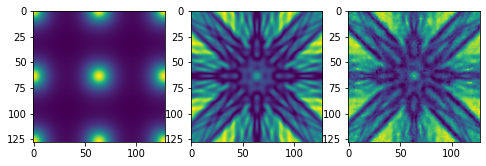

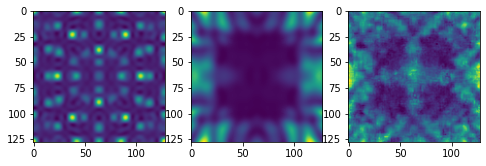

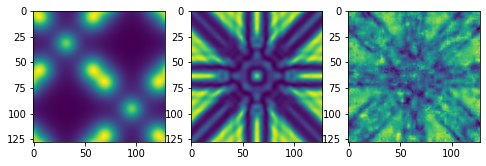

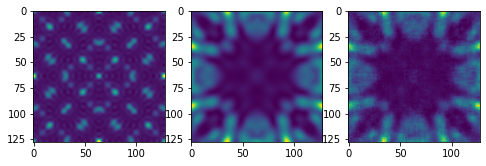

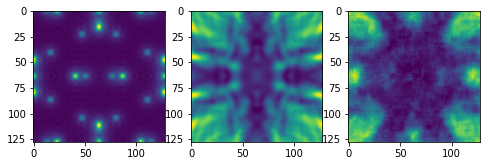

In [20]:
for i in range(100):
    x = np.load(data[0][0][i])
    y = np.load(data[0][1][i])
    a = np.reshape(vae(np.reshape(x, (1, 128, 128, 1))), (128, 128))


    w=10
    h=10
    fig=plt.figure(figsize=(8, 8))
    columns = 3
    rows = 1
    fig.add_subplot(rows, columns, 1)
    plt.imshow(x)
    fig.add_subplot(rows, columns, 2)
    plt.imshow(y)
    fig.add_subplot(rows, columns, 3)
    plt.imshow(a)
    plt.show()